# Final Project Submission

* Student name: **Alex Husted**
* Student pace: **Online Full Time**
* Scheduled project review date/time: **Tuesday May 21, 2019 2:00 EST**
* Instructor name: **Rafael Carrasco**
* Blog post URL: 

# Project Outline - Jumpstart Realty

This notebook represents the final project in Module 1 of Flatiron's Data Science Bootcamp. The Module began with in-depth introductions of the Python language with significant lessons on loops and funtions. Then the Module moved to noteworthy Python libraries and the usefulness of libraries such as Pandas, Numpy, Seaborn, and Matplotlib. Next, Object Oriented Programming (OOP) with classes and instances was presented. Module 1 concluded with the practical employment of statistical distributions to create regression models.

In this project, I will be working with the 'King County House Sales' dataset with the purpose of predicting the future sale price of houses in King County as accurately as possible. I will clean, explore, and model this dataset with a multivariate linear regression to accomplish this purpose. To best illustrate the results of the model, it will be presented from a viewpoint of a hypothetical local startup business, called 'Jumpstart Realty'. Jumpstart Realty looks to offer future buyers with high-caliber information to build trust between buyers and realtors. This project will follow a certain methodology, named OSEMiN, to build a best-fit model. OSEMiN suggests to follow certain relational steps to help us understand the data and build our model. These steps are listed below:

* **Project Method (OSEMiN)**
    * Obtain and load the dataset
    * Scrub and clean the data
    * Explore and understand the data value
    * Model the data through testing processes
    * Interpret the results and conclude

Before moving on with the project, I would like to provide the business understanding for Jumpstart Realty. Jumpstart managers, along with senior agents and brokers, will use the resulting model to predict the housing market in King County barring drastic changes in the economy. The scope of the project includes housing data within King County, the economic health of buyers in the county, and the value of predictors that contribute to housing sales. The project will begin on Monday May 13th, 2019 and is expected to be completed within a week, on Sunday May, 19th 2019. It's expected that all stateholders involved will conclude with the same understanding of the model and resulting datset. 

# Obtain

The process of loading the dataset is relatively straightforward, but salient nonetheless. Now that the business understanding is solidified, it's time to import the necessary Python libraries and eventually the dataset, which is stored in a .csv file titled 'kc_house_data.csv'.

In [1]:
# Import necessary python libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# Load the dataset
kc = pd.read_csv("kc_house_data.csv")

# Inspect the first 5 rows and all columns of the dataset
kc.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [3]:
# Get information on datatypes of variables
kc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


In [4]:
# Analyze basic statistics of each column
kc.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


**Primary Observations:** 

In the first inspection into the dataset, it's important to notice that there are 21,597 data entries and 21 columns seperating those values. 

Beginning using the .head( ) method, there are many predicting variables to work with the intention to predict future sale prices of housing in King County. Some early significant predictors include sqft_living, sqft_lot, waterfront, grade, yr_renovated, and possibly sqft_living15. 

Proceeding with analyzing the datatypes, using the .info( ) method, most of the datatypes are stored within integers and floats. There are a few objects that include date and sqft_basement (which should be stored as an integer). 

Then moving forward with the .describe( ) method, the distribution of the dataset becomes known:


* Outliers in the square footage columns with the max values in some columns over 10,000 ft above the mean. 

* The max value in the 'grade' column is 13, meaning the grading scale includes values over 10. 

* The average house was build in 1970.

* There is an average of 2.1 bathrooms per household in the dataset, min value is 0.5 and max is 8.  

* There is an average of 3.3 bedrooms per household in the dataset, min value is 1 and max is 33. 

* The average housing price is 540,000, with a min value of 78,000 and a max of 7,700,000.

* Houses seem to be in pretty good condition, with an average condition rating of 3.4 (1-5 scale).


# Scrub and Clean

During this stage, the data will become processed and ready for exploration. Important steps for this stage include identifying and removing null values, converting datatypes, dealing with outliers, normalizing data, as well as checking for and removing correllated predictors. Data cleaning ensures that the dataset is useable by identifying any errors or corruptions, correcting and manually processing them to prevent errors during the exploration and modeling phases. Let's begin. 

### **Drop Column:** 
Although the id column is important during data entry, it is not significant when building a model to predict future housing prices, therefore I will drop this from our DataFrame.

In [5]:
# Drop the id column
kc = kc.drop('id', axis = 1)

### **Dealing with Null Values:** 

Dealing with null values is a key factor to build an accurate model for the dataset. To do this, I will first identify if/where null values exist and check how many exist. 

In [6]:
# Any null values?
kc.isna().any()

date             False
price            False
bedrooms         False
bathrooms        False
sqft_living      False
sqft_lot         False
floors           False
waterfront        True
view              True
condition        False
grade            False
sqft_above       False
sqft_basement    False
yr_built         False
yr_renovated      True
zipcode          False
lat              False
long             False
sqft_living15    False
sqft_lot15       False
dtype: bool

In [7]:
# How many null values?
kc.isna().sum()

date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

It appears that null values exist for the columns of waterfront, view, and yr_renovated. Considering our dataset contains 21,597 entries, these null values account for almost 20% of the dataset for each column, respectively (except for 'view'). 

When inspecting the *waterfront* column, notice there are only 146 instances out of 19,9221 entries, 0.80%, in which properties actually sit on the waterfront. To deal with the null *waterfront* values, we can be confident in replacing these null values with a 'False' entry.

In [8]:
# Count how many properties lie on the waterfront
kc.waterfront.sum()

146.0

In [9]:
# Replace null waterfront values with 'False'
kc.waterfront = kc.waterfront.fillna(value=False)

Now that null values have been replaced in the *waterfront* column, *yr_renovated* must be dealt with. Almost 20% of the dataset in this column is null. It doesn't make sense to remove these columns as much of the data would be replaced. A better option would be to change values that have '0' to reflect the intial construction date (i.e. if a house was never renovated but was built in 1950, then the renovation date would reflect 1950). 

In [10]:
# Replace the null values in yr_renovated to yr_built
kc.yr_renovated = kc.yr_renovated.fillna(value=kc.yr_built)

In [11]:
# Replace the zero values in yr_renovated to yr_built
kc.yr_renovated = kc.yr_renovated.replace(to_replace=0, value=kc.yr_built)

Both *waterfront* and *yr_built* null values have been dealt with and the final null value to deal with is the *view* column. The null values here are a relatively low percentage of the dataset. There are two options - to drop the rows altogether or replace the values with a common occurring value in the column. Looking at the distribution of the dataset, it seems that over 75% of the data within the column retains a '0' value. I am confident in replacing the null values with 0.

In [12]:
# Replace null view values with '0'
kc.view = kc.view.fillna(value=0.0)

In [13]:
# Check how many null values remain
kc.isna().sum()

date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

*There is one exception to this dataset where null values must be ADDED. In the predictor *sqft_basement*, *basements that do not exist have a square footage of zero. This is problematic further down the line when analyzing linear regression graphs. To resolve this problem, '0.0's in the *sqft_basement* column will be replaced with zeros.* This will occur in the next section:

Amazing, all null values have been dealt with, except for the proper addition of null values in the *sqft_basement* predictor. Time to progess onward with our data cleaning process by converting datatypes into the proper form. 

### **Converting Datatypes:** 
As the dataset becomes clearer and datatypes are identified, there are a few instances of datatypes stored as integers that need to be converted into objects, as well as objects into strings. In looking at our .info( ) method, it's clear that *waterfront* should be stored as a categorical string datatype. There's also a case in which an object should be converted into a string, which occurs in the sqft_basement column. 

In [14]:
# Change waterfront value to boolean
kc.waterfront = kc.waterfront.astype("bool") 

In [15]:
# Change view value to int
kc.view = kc.view.astype("int64") 

In [16]:
# Replace ? with 0.0
kc.sqft_basement = kc.sqft_basement.replace(to_replace='?', value=0.0)

In [17]:
# Change sqft_basement value to float
kc.sqft_basement = kc.sqft_basement.astype("float64") 

In [18]:
# Change yr_renovated to an int
kc.yr_renovated = kc.yr_renovated.astype('int64')

In [19]:
# Change zipcode to an object
kc.zipcode = kc.zipcode.astype('str')

In [20]:
# # Change 0.0 in sqft_basement to NULL value
# kc.loc[kc['sqft_basement'] == 0,'sqft_basement'] = np.nan

In [21]:
print(kc.info())
kc.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null bool
view             21597 non-null int64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null int64
zipcode          21597 non-null object
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: bool(1), float64(6), int64(11), object(2)
memory usage: 3.2+ MB
None


,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,10/13/2014,221900.0,3,1.00,1180,5650,1.0,False,0,3,7,1180,0.0,1955,1955,98178,47.5112,-122.257,1340,5650
1,12/9/2014,538000.0,3,2.25,2570,7242,2.0,False,0,3,7,2170,400.0,1951,1991,98125,47.7210,-122.319,1690,7639
2,2/25/2015,180000.0,2,1.00,770,10000,1.0,False,0,3,6,770,0.0,1933,1933,98028,47.7379,-122.233,2720,8062
3,12/9/2014,604000.0,4,3.00,1960,5000,1.0,False,0,5,7,1050,910.0,1965,1965,98136,47.5208,-122.393,1360,5000
4,2/18/2015,510000.0,3,2.00,1680,8080,1.0,False,0,3,8,1680,0.0,1987,1987,98074,47.6168,-122.045,1800,7503


For the liking of this dataset, all values have been converted into their proper form. In the converting datatypes section, five predictors were edited to format the dataset for modeling. Now that the null values have been replaced and the datatypes have been converted there are a few techniques to add before beginning the normalizing phase. 

### Add Columns

A few columns should be added to solidify the understanding of the King County dataset. Specifically, it would be useful to know if each house included a basement or if the house has ever been renovated. 

In [22]:
# Add column to indicate a basement
kc['basement'] = np.where(kc['sqft_basement']>1, 'True', 'False')

In [23]:
# Add column to indicate renovation
kc['renovated'] = np.where(kc['yr_renovated']==kc.yr_built, 'False', 'True')

In [24]:
# Add column to indicate total sqft
kc['sqft_total'] = (kc['sqft_basement']>1) + kc['sqft_above']

In [25]:
kc.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,basement,renovated,sqft_total
0,10/13/2014,221900.0,3,1.00,1180,5650,1.0,False,0,3,...,1955,1955,98178,47.5112,-122.257,1340,5650,False,False,1180
1,12/9/2014,538000.0,3,2.25,2570,7242,2.0,False,0,3,...,1951,1991,98125,47.7210,-122.319,1690,7639,True,True,2171
2,2/25/2015,180000.0,2,1.00,770,10000,1.0,False,0,3,...,1933,1933,98028,47.7379,-122.233,2720,8062,False,False,770
3,12/9/2014,604000.0,4,3.00,1960,5000,1.0,False,0,5,...,1965,1965,98136,47.5208,-122.393,1360,5000,True,False,1051
4,2/18/2015,510000.0,3,2.00,1680,8080,1.0,False,0,3,...,1987,1987,98074,47.6168,-122.045,1800,7503,False,False,1680


The dataset now seems ready to begin dealing with outliers, normalizing, and removing correllated predictors. With these next steps, we will begin to see a few data visualizations to help understand where the outliers are living and what predictors could be correlated with each other. 

### Outliers

Outliers can represent accurate or inaccurate data. It's important to deal with outliers because they can skew interpretations of data. Outliers are common, especially for large data sets. Nevertheless, in the context of a larger dataset, it's essential to identify deal with outliers to ensure that the interpretation of the King County dataset is as accurate as possible as we move deeper into the OSEMiN process.

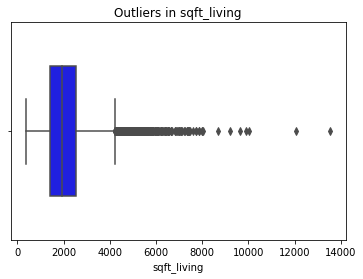

In [26]:
# Find outliers in sqft_living
sns.boxplot(x=kc['sqft_living'], fliersize=5, color='b', width=0.6)
plt.title('Outliers in sqft_living')
plt.show()

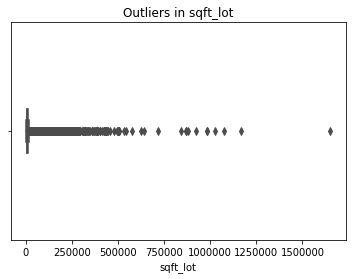

In [27]:
# Find outliers in sqft_lot
sns.boxplot(x=kc['sqft_lot'], fliersize=5, color='r', width=.2, whis=1.5)
plt.title('Outliers in sqft_lot')
plt.show()

Noticing the data points that lie substantially far away from the box and wisker plot, these are considered the outliers that can skew the data in considerable ways. These outliers can be dealt with by using the z-score formula to rid these specific columns of extreme outliers, in this case, data points that lie 4 standard deviations above the mean. The z-score formula can be shown with:

<img src="zform.gif" width = 200>



In [28]:
# Import stats from scipy
from scipy import stats

# Identify the outliers 4 standard deviations away from mean in all columns
def remove_outliers(kc, column_name, threshold=4):
    z_scores = stats.zscore(kc[column_name])
    indices = np.abs(np.where(z_scores > threshold))
    return indices[0]
    
columns_to_check = ['price', 'sqft_living', 'sqft_lot', 'bedrooms', 'bathrooms', 
                   'sqft_living15', 'sqft_lot15']

all_indices = []
for column in columns_to_check:
    indices = remove_outliers(kc, column, threshold=4)
    all_indices.extend(indices)
all_indices = np.unique(all_indices)

In [29]:
# Remove outliers 4 standard deviations from mean in all columns
kc = kc.drop(index=all_indices)
kc.shape

(20927, 23)

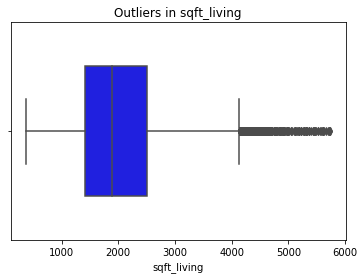

In [30]:
# Find outliers in sqft_living 
sns.boxplot(x=kc['sqft_living'], fliersize=5, color='b', width=0.6)
plt.title('Outliers in sqft_living')
plt.show()

The dataset has been reduced by over 500 values to remove outliers that stood 4 deviations from the mean. This nixed values in our SQFT columns that were outlandish and could have skewed our model in the proceeding steps. The above funtion identifies outliers 4 standard deviations from the mean and creates a list of their unique values. The following .drop( ) method removes those values from the King County dataframe. You can tell the difference between the data points in the BLUE box plot. As of now, the data cleaning process is almost finished. The only tasks left in the process are to check for multicollinearity, normalize specific values and possibly execute feature engineering if necessary. 

### Checking for Multicollinearity

Multicollinearity indicates predictors that are correlated with other predictors.  This happens when a model includes more than one factor that is correlated not just to the target variable, but also to others. As a result, multicollinearity will increase the standard errors of the coefficients. The best ways to check which predictors are correlated with each other is with a heat map and the .corr( ) method. 

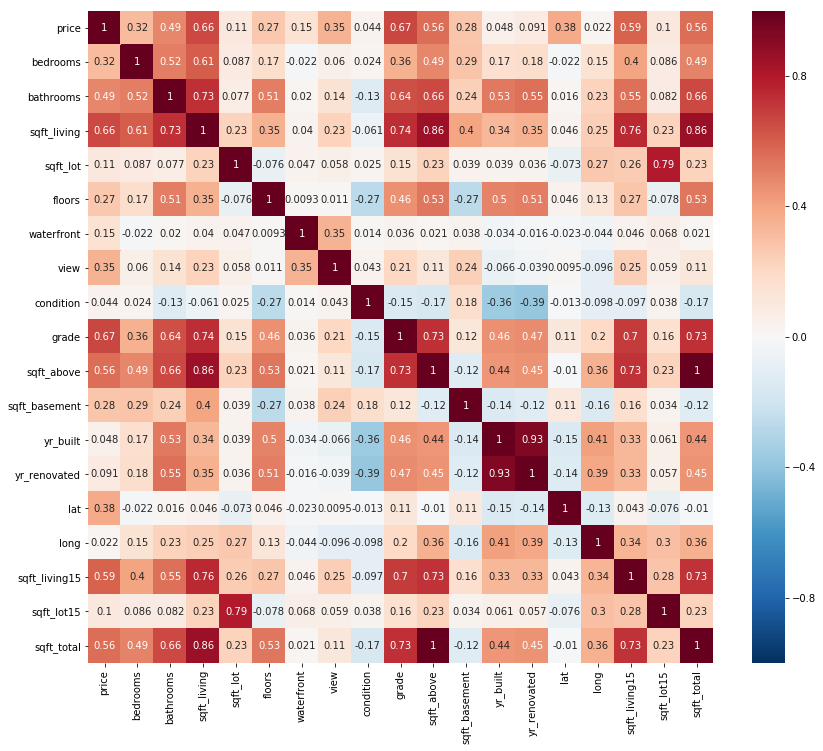

In [31]:
# Plot a heatmap that identifies correlations of predictors
correlation = kc.corr()
plt.figure(figsize=(14, 12))
heatmap = sns.heatmap(correlation, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")

In [32]:
# View correlation matrix
kc.corr()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,sqft_total
price,1.000000,0.316932,0.490833,0.663593,0.107906,0.271758,0.153385,0.349154,0.044495,0.667904,0.561986,0.278284,0.048289,0.090550,0.376023,0.021776,0.587020,0.103408,0.562190
bedrooms,0.316932,1.000000,0.515002,0.606042,0.086613,0.172513,-0.021518,0.060412,0.024177,0.356572,0.492178,0.287494,0.170510,0.176563,-0.021861,0.147524,0.404819,0.085541,0.492352
bathrooms,0.490833,0.515002,1.000000,0.732587,0.076814,0.508417,0.019515,0.141650,-0.131086,0.641356,0.657635,0.238734,0.528188,0.551294,0.015661,0.231479,0.551526,0.081695,0.657833
sqft_living,0.663593,0.606042,0.732587,1.000000,0.230249,0.351884,0.039544,0.230037,-0.060687,0.740918,0.859229,0.395265,0.335471,0.353000,0.046309,0.249563,0.755381,0.231769,0.859488
sqft_lot,0.107906,0.086613,0.076814,0.230249,1.000000,-0.075808,0.046824,0.058321,0.025286,0.147203,0.226955,0.039074,0.038737,0.035793,-0.073234,0.273193,0.255018,0.792613,0.226969
floors,0.271758,0.172513,0.508417,0.351884,-0.075808,1.000000,0.009298,0.011323,-0.270026,0.459545,0.534899,-0.271628,0.497652,0.508206,0.045807,0.127583,0.273852,-0.077570,0.534814
waterfront,0.153385,-0.021518,0.019515,0.039544,0.046824,0.009298,1.000000,0.345708,0.013684,0.035747,0.021353,0.037850,-0.033670,-0.015804,-0.022646,-0.043605,0.046480,0.068324,0.021370
view,0.349154,0.060412,0.141650,0.230037,0.058321,0.011323,0.345708,1.000000,0.042587,0.206481,0.112486,0.240934,-0.066301,-0.039044,0.009545,-0.096431,0.245520,0.058930,0.112612
condition,0.044495,0.024177,-0.131086,-0.060687,0.025286,-0.270026,0.013684,0.042587,1.000000,-0.153203,-0.167389,0.176800,-0.359562,-0.388353,-0.012877,-0.098485,-0.096952,0.037714,-0.167333
grade,0.667904,0.356572,0.641356,0.740918,0.147203,0.459545,0.035747,0.206481,-0.153203,1.000000,0.733240,0.122130,0.460579,0.469913,0.112921,0.201125,0.698117,0.161611,0.733378


In [33]:
# Return "True" for positive or negative correlations that are bigger than 0.75.
abs(kc.corr())>0.75

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,sqft_total
price,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bedrooms,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
sqft_living,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,True
sqft_lot,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False
floors,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
waterfront,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
grade,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False


In [34]:
# Remove most problematic feature (sqft_living)
kc = kc.drop("sqft_living",axis=1)

During this step, one of the biggest predictors that most people would suggest directly explains variances in housing prices was removed from the dataset. This was achieved because our ***sqft_living*** predictor directly correlates with the greatest about of features within the dataset. Notice the column in the above .corr( ) method, *sqft_living* correlates with two other variables which include *sqft_above* and *sqft_living15*. These two variables correlate with each other because they both account for very similar values. 

### Normalize

The final step for Jumstart Realty in the data cleaning process is to normalize the data. Normalizing the data set suggesrs converting each numeric value to it's corresponding ***z-score*** for the column, which is obtained by subtracting the column's mean and then dividing by the column's standard deviation for every value. The formula for this will be the same used in the detecting outliers stage. 

In [35]:
# Normalize all numeric columns using z-score
kc.price = (kc.price - kc.price.mean()) / kc.price.std()
kc.sqft_lot = (kc.sqft_lot - kc.sqft_lot.mean()) / kc.sqft_lot.std()
kc.bedrooms = (kc.bedrooms - kc.bedrooms.mean()) / kc.bedrooms.std()
kc.bathrooms = (kc.bathrooms - kc.bathrooms.mean()) / kc.bathrooms.std()
kc.floors = (kc.floors - kc.floors.mean()) / kc.floors.std()
kc.sqft_above = (kc.sqft_above - kc.sqft_above.mean()) / kc.sqft_above.std()
kc.sqft_basement = (kc.sqft_basement - kc.sqft_basement.mean()) / kc.sqft_basement.std()
kc.sqft_living15 = (kc.sqft_living15 - kc.sqft_living15.mean()) / kc.sqft_living15.std()
kc.sqft_lot15 = (kc.sqft_lot15 - kc.sqft_lot15.mean()) / kc.sqft_lot15.std()

kc.head()

,date,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,basement,renovated,sqft_total
0,10/13/2014,-1.039211,-0.401517,-1.487348,-0.362833,-0.903307,False,0,3,7,...,1955,1955,98178,47.5112,-122.257,-0.950188,-0.377262,False,False,1180
1,12/9/2014,0.085855,-0.401517,0.226775,-0.250424,0.949342,False,0,3,7,...,1951,1991,98125,47.7210,-122.319,-0.411105,-0.198337,True,True,2171
2,2/25/2015,-1.188342,-1.538840,-1.487348,-0.055686,-0.903307,False,0,3,6,...,1933,1933,98028,47.7379,-122.233,1.175340,-0.160286,False,False,770
3,12/9/2014,0.320763,0.735806,1.255249,-0.408729,-0.903307,False,0,5,7,...,1965,1965,98136,47.5208,-122.393,-0.919383,-0.435734,True,False,1051
4,2/18/2015,-0.013803,-0.401517,-0.116050,-0.191254,-0.903307,False,0,3,8,...,1987,1987,98074,47.6168,-122.045,-0.241679,-0.210571,False,False,1680


Throughout this stage, the data became processed and is now ready for exploration. The scrub and cleaning process included identifying and removing null values, converting datatypes, dealing with outliers, normalizing data, as well as checking for and removing correllated predictors. As we move forward, clean data ensures the dataset is in the best possible condition during exploration and especially for building an accurate model. 

# Exploration

Exploratory Data Analysis, or EDA, is an integral part of understanding the King County dataset. Before moving towards building models for King County, it's vital to become familiar with different realtionships within the data. Analyzing these relationships will provide intuition about how to interpret the results of the proceeding models. Asking questions about these relationships beforehand might also supply additional knowledge about relationships that we might have not known existed. This section will further investigate the distribution of data and ask specific questions about the housing market in King County. 

### Build Density Plot

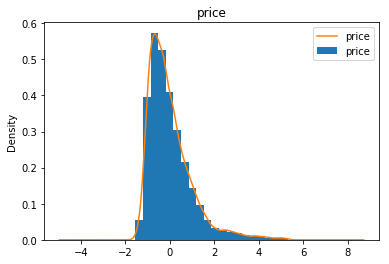

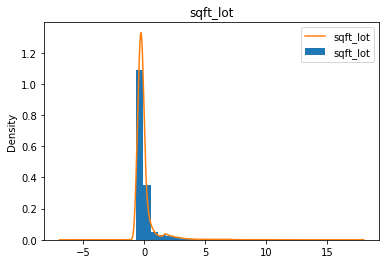

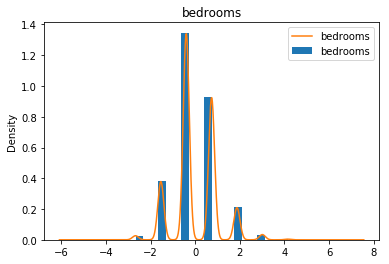

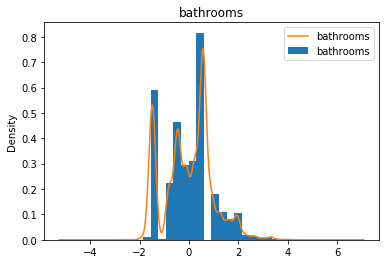

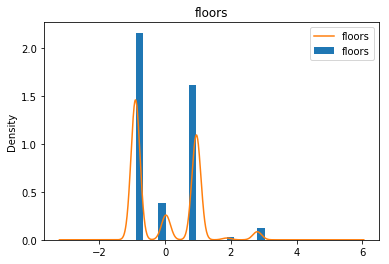

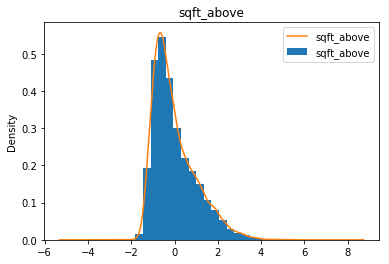

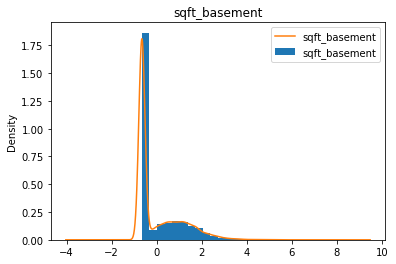

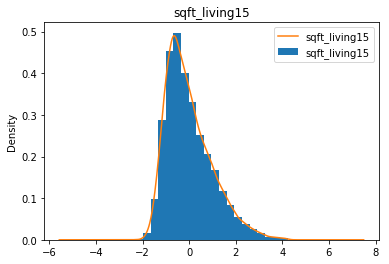

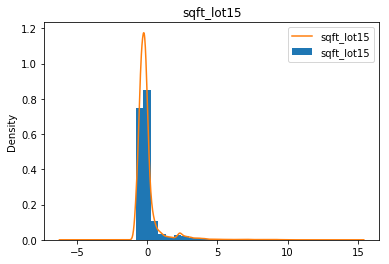

In [36]:
# Plot a KDE for columns in dataset
for column in ['price', 'sqft_lot', 'bedrooms', 'bathrooms', 'floors',  
                   'sqft_above', 'sqft_basement','sqft_living15', 'sqft_lot15']:
    kc[column].plot.hist(density = True, bins = 20)
    kc[column].plot.kde(label = column)
    plt.title(column)
    plt.legend()
    plt.show()

In reviewing these histogram/KDE plots, it's clear to notice that there is positive skew in most of the data. This is resulting from an excess of housing prices and size in square feet of the houses/lot lying a few postive standard deviations from the mean. The peaks within these plots display where the values are concentrated over the interval. The peaks in price and square feet lie slightly below zero. 

### Build Joint Plot

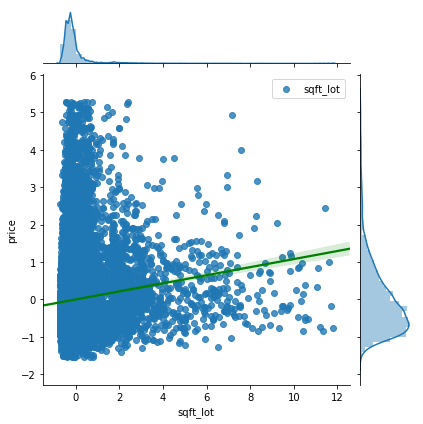

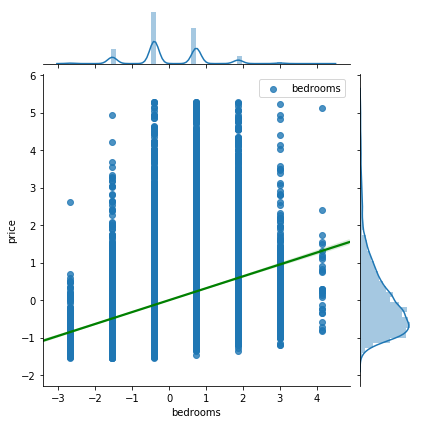

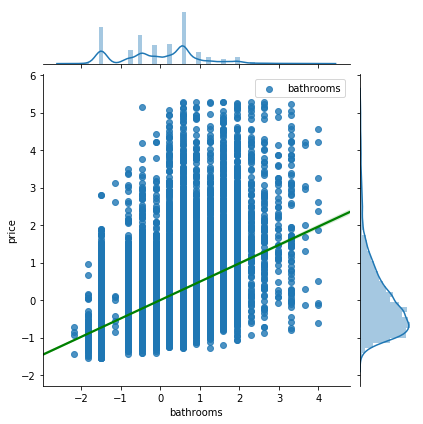

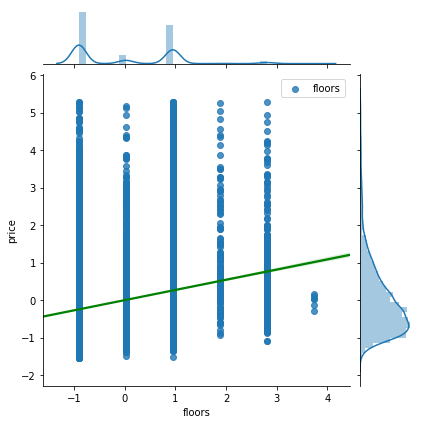

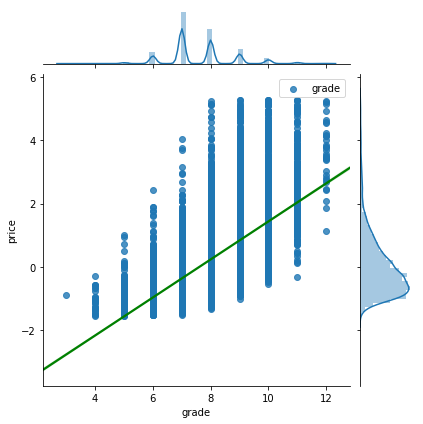

...

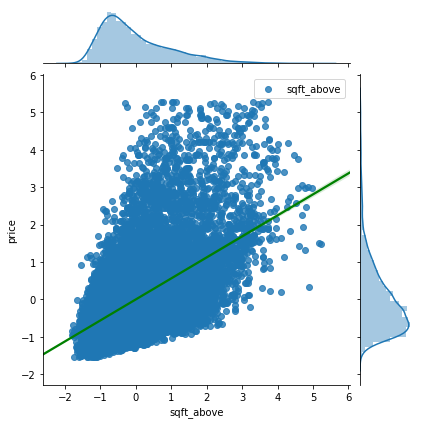

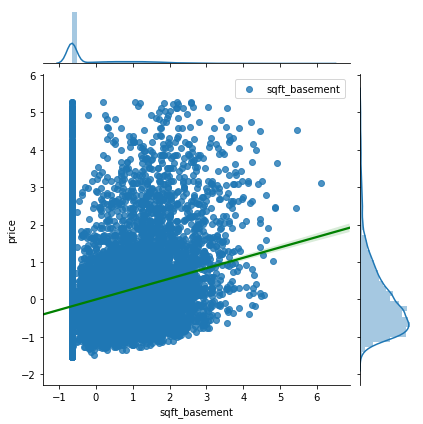

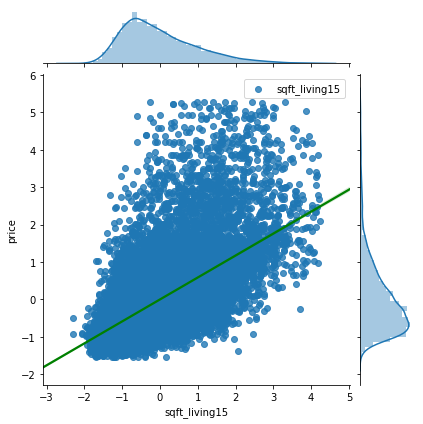

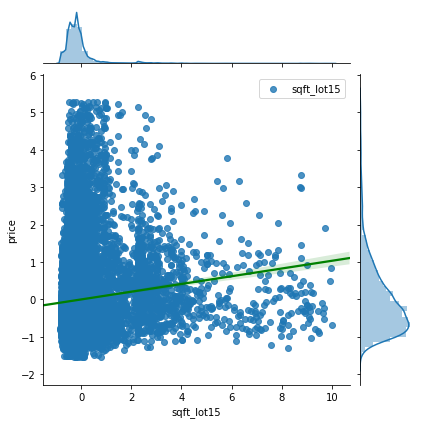

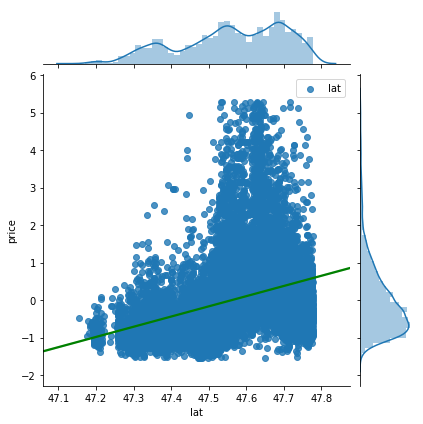

In [37]:
# Build joint plots to check for linearity assumption between predictors and target variable
for column in ['sqft_lot', 'bedrooms', 'bathrooms', 'floors', 'grade', 'condition',
                   'sqft_above', 'sqft_basement','sqft_living15', 'sqft_lot15', 'lat']:
    sns.jointplot(x = column, y ='price',
                  data = kc, 
                  kind = 'reg', 
                  label = column,
                  joint_kws = {'line_kws':{'color':'green'}})
    plt.legend()
    plt.show()

With these join plots, we are checking for linearity assumption between predictors and target variable. In other words, the first scatter visualizations are given that can display the positive correlations between the *price* column and other columns in the dataframe. Specifically, it's clear to identify that *bathrooms*, *floors*, *sqft_above*, *sqft_basement*, *grade*, and *sqft_living15* have a positive correlation with housing prices. When building the model, it will be essential to consider inluding these predictors. 

### Housing Prices by Zipcode:

For the purpose of even futher understanding the dataset, it's meaningful to be curious. Asking questions is the first place to start. In this instance, I would like to find out where in King County housing prices will be the highest. 

* **Task:** Predict where in King County housing prices will be the highest.


* **Question:** *In which zipcode will produce the most expensive houses?*


* **Prediction:** Puget Sound properties on the West side of downtown Seattle. 

<img src="kingcountyzip.jpg" width = 500>

In [38]:
# Use sns.swarmplot to plot zipcode vs. sqft_living
plt.figure(figsize=(250,80))
sns.swarmplot(x="zipcode", y="price", data=kc)
plt.title('Housing Prices by Zipcode')
plt.xlabel('Price', fontsize=90)
plt.ylabel('Zipcode', fontsize=90)
plt.rc('xtick', labelsize=40) 
plt.rc('ytick', labelsize=40)
plt.show()

**Interpretation:** Using the SwarmPlot from the seaborn library, we are given the distribution of housing prices for each zipcode in King County. The results came back much differently than predicted. The top three zipcodes in which housing prices are the highest is 98004, 98040, and 98112. Here is some information about each of these zipcodes:

* **98004**: 
    * City = Bellevue, WA. 
    * Population = 27,946. 
    * Mean property value = 952,200. 
    * Mean income per household = 117,321. 
    * Median age = 39 years old. 
    * Public school rating = 8/10.
* **98040**:
    * City = Mercer Island, WA.
    * Population = 22,699.
    * Mean property value = 864,000.
    * Mean income per household = 126,359	
    * Median age = 46 years old.
    * Public school rating = 10/10.
* **98112**:
    * City = Seattle, WA
    * Population = 21,077.
    * Mean property value = 980,578.
    * Mean income per household = 96,054.
    * Median age = 39 years old.
    * Public school rating = 7/10.

<img src="kingcountyzip2.jpg" width = 500>

It seems the previous predictions of housing prices in the Puget Sound were a bit off, however the zipcode of 98119 does carry high property values than average. Looking at the results, commonalities in the zipcodes that present the most expensive housing prices include the mean income per household and the school rating. Bellevue and Mercer Island both retain their own public school district, with high distinction. Seattle public schools are rated a bit lower, however still retain a 7/10 rating. 

### Basement vs Housing Prices:

In this next exploration let's look at our *basement* columns within the dataset. Some properties do not include a basement, others do. To answer the question provided below, we will be looking at both the *sqft_basement* column and the *basement* columns versus our *price* columns. 

* **Task:** Predict if basements have an impact on housing prices.


* **Question:** *Does having a basement increase the housing price in King County? If so, does basement size increase housing price?*


* **Prediction:** Having a basement will increase housing price. 

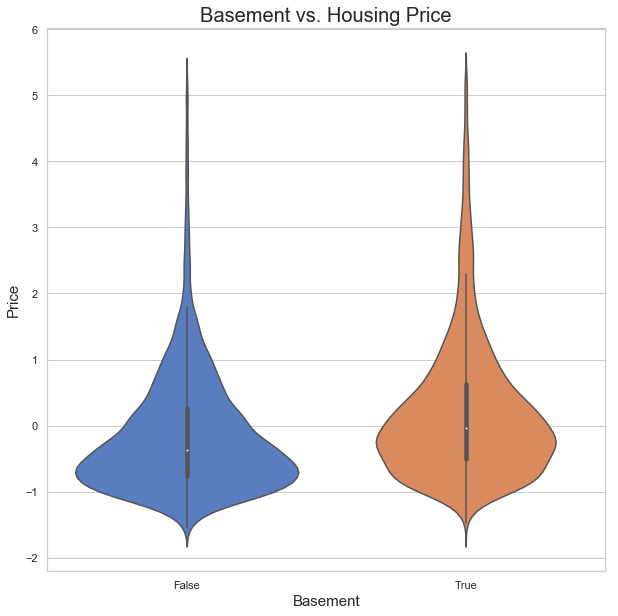

In [39]:
# Create a violin plot to analyze basement vs. housing price
plt.figure(figsize=(10,10))
sns.set(style="whitegrid", palette="muted", color_codes=True)
sns.violinplot(x = 'basement', y = 'price', data=kc)
plt.title('Basement vs. Housing Price', fontsize=20)
plt.xlabel('Basement', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.show()

**Interpretation:** Violin plots identify probablity density of our data. The middle line is a kernel density estimation to show the distribution shape of the data. The wider sections of the violin plot represent a higher probability that datapoints will conform to that value, and more skinny portions represent a lower probability. The white dot in the middle represents the mean. In these results about housing prices relating to the inclusion of a bsaement, the prediction yields to be True. It's clear to tell the mean housing price is HIGHER when a basement is included in the property. It also appears that housing prices in the upper quartiles are more expensive when a basement is included. 

Let's find out if the size of the basement will have a positive correlation with housing prices:

<Figure size 2880x2880 with 0 Axes>

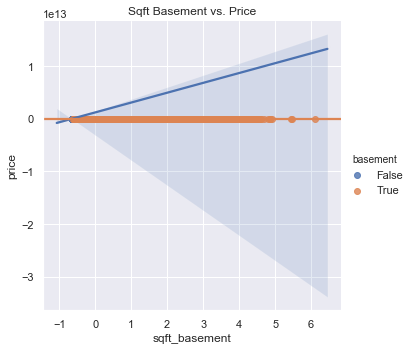

In [40]:
# Use lmplot to indicate if basement size increases housing price
plt.figure(figsize=(40,40))
sns.set(color_codes=True)
sns.lmplot(x = "sqft_basement", y = "price", hue = "basement", data=kc)
plt.title('Sqft Basement vs. Price')
plt.show()

With the above lmplot we are able to identify that when a house includes a larger basement in square footage, it will usually increase the value of the house. However there are a few outliers in the upper left portion of the graph, the orange line that strikes through the graph signifies a positive correlation with the inclusion of a basement. The given orange line is not a perfect line of best fit, but it respresents the flow of data. 

### Year Built vs. Housing Price:

For this next exploration let's look at our *yr_built* column within the dataset. When looking at the dataset, the oldest property built in King County is in 1900. The newest proprty built finished just recently in 2015. There is a spread of 115 years of property ages within this dataset.  To answer the question provided below, we will be looking at both the *yr_built* column and the *price* columns.

* **Task:** Predict if year built has an impact on housing prices.


* **Question:** *Are houses built more recently more valuable, in terms of price, compared to houses built more than half a century ago?*


* **Prediction:** Houses completed more recently will be more expensive. 

In [41]:
# Use sns.violinplot to plot yr_built vs. housing prices
plt.figure(figsize=(250,120))
sns.violinplot(x="yr_built", y="price", data=kc)
plt.title('Year Built vs. Price', fontsize=90)
plt.xlabel('Price', fontsize=90)
plt.ylabel('Year Built', fontsize=90)
plt.rc('xtick', labelsize=40) 
plt.rc('ytick', labelsize=40)
plt.show()

**Interpretation:** Using this wide-ranging violin plot to analyzing housing values in the 115 year span between 2015 and 1900, it's clear to notice houses built pre-1930 and post-1996 result in the highest average value. Houses built between 1942 and 1980 average the lowest value within the dataset. For Jumpstart Realty, driving the prices up for old AND new homes seems like the best plan of action as these homes pre-1930 and post-1996 have the highest market value. For the homes that lie in the middle of this 115 range, it's important for Jumpstart to understand these homes have the least value on the market. Initial predictions of 'houses completed more recently will be more expensive' was not entirely incorrect, as housing prices were higher in houses completed in the past two decades. But the prediciton failed to mention housing prices completed pre-1930, in which our visualization proved to be so. 

### Housing Grade vs. Year Built & Price:

With this exploration, let's analyze the *grade* column within the dataset. The grade of the house represents the construction quality of improvements. An average grade of construction and design is a 7 (grades range from 1-13), and is commonly seen in plats and older sub-divisions. To complete this analysis, the *grade* column will be compared with the year the house was completed and it's effect on price. 

* **Task:** Predict if grade correlates to grade and housing prices.


* **Question:** *Does the grade of the house correlated to the year it was built? What does that say about it's housing price?*


* **Prediction:** Houses completed more recently will have a higher grade and price. 

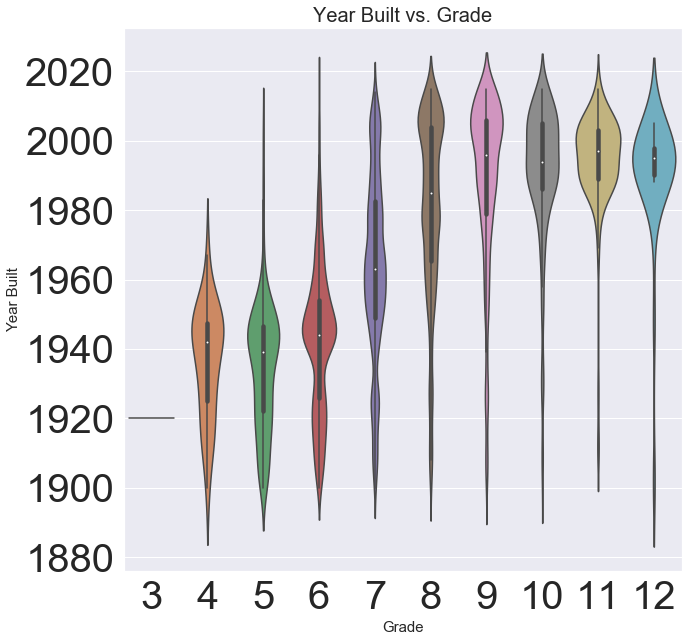

In [42]:
# Use sns.violinplot to plot year_built vs. grade
plt.figure(figsize=(10,10))
sns.violinplot(x = "grade", y = "yr_built", data=kc)
plt.title('Year Built vs. Grade', fontsize=20)
plt.xlabel('Grade', fontsize=15)
plt.ylabel('Year Built', fontsize=15)
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10)
plt.show()

**Interpretation:** With this violin plot, there is visible distinction that newer houses provide a better housing grade. The mean of houses built before 1980 contain a grade rating of 7 or below. For the average house built after 1980, the grades range from 8-12. There is a clear relationship in which the year a house was built directly impacts it's rating from the King County residential department. Moving forward with this exploration, let's try to find out if grade impacts the housing price.

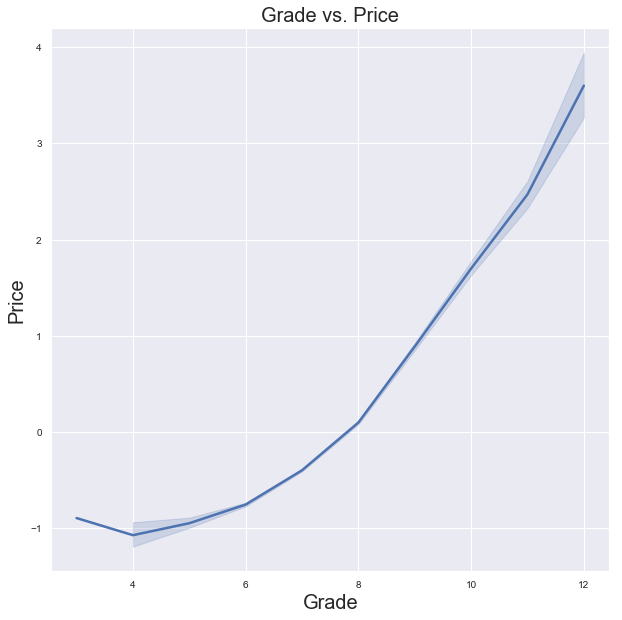

In [43]:
# Use a line plot to display grade and price
plt.figure(figsize=(10,10))
sns.lineplot(x = "grade", y = "price", data=kc, linewidth=2.5)
plt.title('Grade vs. Price', fontsize=20)
plt.xlabel('Grade', fontsize=20)
plt.ylabel('Price', fontsize=20)
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10)
plt.show()

The above line plot confirms the predictions that if a house if graded highly, it's price will become more valuable. Using grade in this instance will be a great feature to add into the model in the next phase. Within the exploration completed here, it's noteworthy to identify that newer houses result in a higher grade, which created a feedback loop driving the value of the house upwards. 

In [44]:
# Does renovating your house effect condition and grade? Does renovating house effect price

### Renovations vs. Condition, Grade & Price:

This final exploration will use the *renovation* column to determine if renovating a house will increase it's condition, grade, and price. The condtion of a house is relative to age and grade, coded 1-5. An average score of 3 indicates some evidence of deferred maintenance and normal obsolescence with age in that a few minor repairs are needed, along with some refinishing. All major components still functional and contributing toward an extended life expectancy. Effective age and utility is standard for like properties of its class and usage.
The grade of the house represents the construction quality of improvements. An average grade of construction and design is a 7 (grades range from 1-13), and is commonly seen in plats and older sub-divisions. To complete this analysis, the *renovation* column will be compared with the condition of the house, grade of the house, and it's price. 

* **Task:** Predict if renovations play a role in housing prices.


* **Question:** *Can renovating a house increase not only it's condition and grade, but also it's value?*


* **Prediction:** Renovations will positively impact all three predictors.

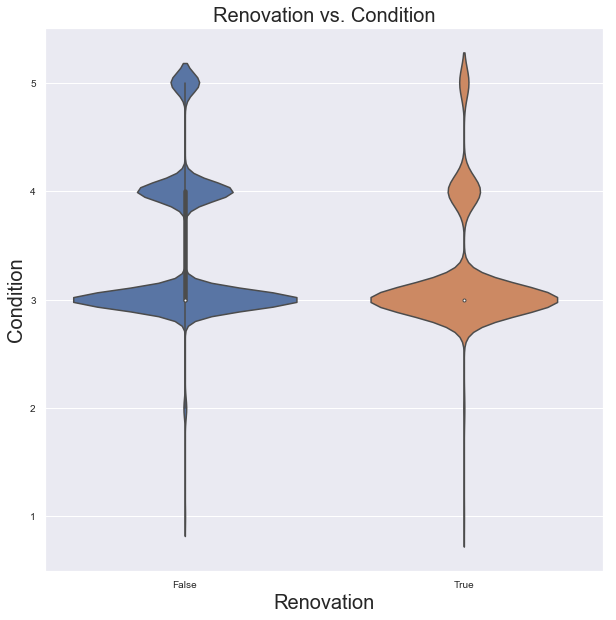

In [45]:
# Use sns.violinplot to plot renovation vs. condition
plt.figure(figsize=(10,10))
sns.violinplot(x = "renovated", y = "condition", data=kc)
plt.title('Renovation vs. Condition', fontsize=20)
plt.xlabel('Renovation', fontsize=20)
plt.ylabel('Condition', fontsize=20)
plt.rc('xtick', labelsize=4) 
plt.rc('ytick', labelsize=4)
plt.show()

**Interpretation:** Surprisingly, according to this visualization, if an owner has renovated the house it has a minimal impact on the overall condiiton for properties in King County. This might be due to the fact that a condition grade takes into effect the age of the house as one of its' metrics. Let's find out if this is also true for the *grade* of the house:

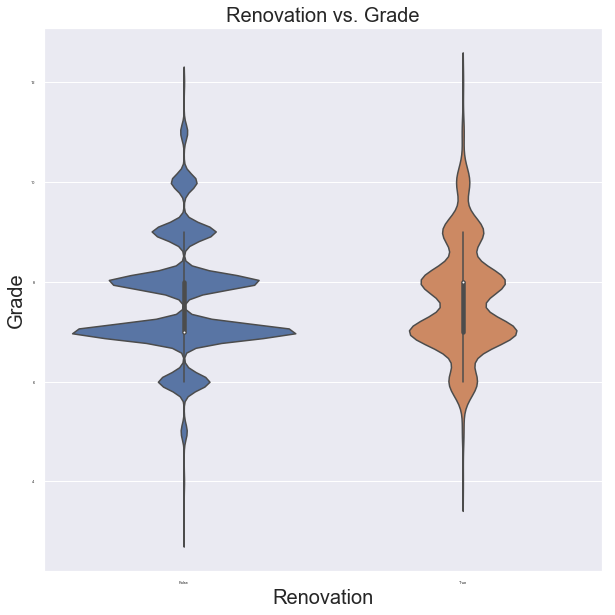

In [46]:
# Use sns.violinplot to plot renovation vs. grade
plt.figure(figsize=(10,10))
sns.violinplot(x = "renovated", y = "grade", data=kc)
plt.title('Renovation vs. Grade', fontsize=20)
plt.xlabel('Renovation', fontsize=20)
plt.ylabel('Grade', fontsize=20)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)
plt.show()

Again, surprisingly, if an owner has renovated the house it has a minimal impact on the overall grade for property. However, there is a slightly larger margin in this visualization. Notice the white dot in these boolean columns is different. If a house has been renovated, the mean grade for the house is an 8. If a house hasn't been renovated, the mean grade for the house is an 7. There is something to be said about renovating a house. Finally, let's check if renovation has a correlation to price: 

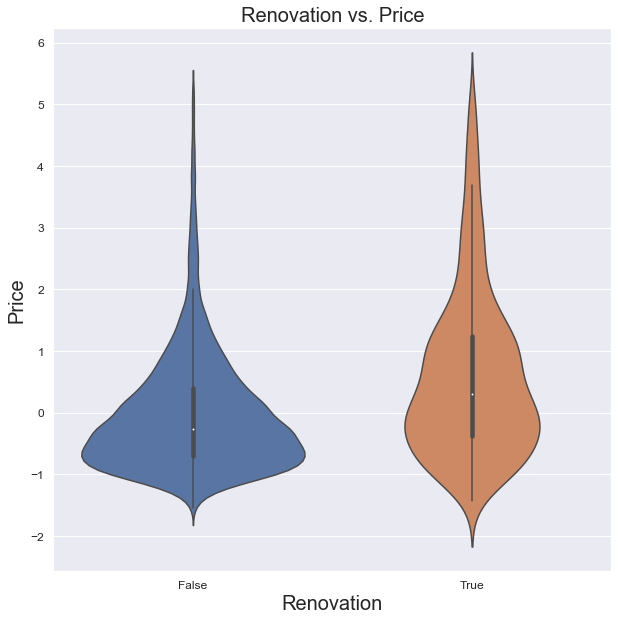

In [47]:
# #Use sns.violinplot to plot renovation vs. price
plt.figure(figsize=(10,10))
sns.violinplot(x = "renovated", y = "price", data=kc)
plt.title('Renovation vs. Price', fontsize=20)
plt.xlabel('Renovation', fontsize=20)
plt.ylabel('Price', fontsize=20)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)
plt.show()

Here we see a distinct difference between renovating a house and not renovating a house when identifying its' value. Renovating a house results in a higher value of almost one standard deviation than not renovating a house. This is an important feature to account for when building the model. This was the final visual created during the exploration step. It's time to move forward with one of the most important pieces of Data Science, which is building a model. 

### Waterfront:

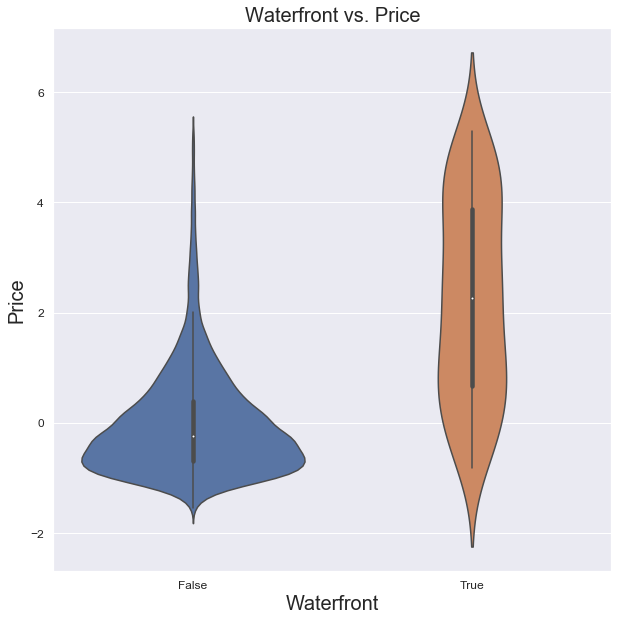

In [48]:
# #Use sns.violinplot to plot waterfront vs. price
plt.figure(figsize=(10,10))
sns.violinplot(x = "waterfront", y = "price", data=kc)
plt.title('Waterfront vs. Price', fontsize=20)
plt.xlabel('Waterfront', fontsize=20)
plt.ylabel('Price', fontsize=20)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)
plt.show()

# Modeling

Modeling is about prediction. In this model, we will be utilizing linear regression. In simple linear regression, there is a one-to-one relationship between the target variable and the predictor variable. However in multiple linear regression, there is a many-to-one relationship. Instead of using one input features, several are employed to identify the best relationship within your data. Furthermore, data models often use multiple iterations of linear regression to view the same data and ensure that all processes and correlations have been fulfilled to create a best-fit model. The mathematical equation for linear regression is as follows: 

<img src="MLR.png" width = 400>

Revisiting the goal of this project, Jumpstart Realty wants to predict the future sale price of houses in King County as accurately as possible for the purpose of offering future buyers with high-caliber information to build trust between buyers and realtors. With the appropriate features within this dataset selected, Jumpstart will be able to build a future model to accurately estimate future values of properties. 


In [49]:
# Import necessary libraries for modeling
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

### Simple Linear Regression

To begin building an accurate model, let's start by building a linear regression that only takes one feature and pairs it with our target. In this case, *sqft_total* will become our feature to be paired with our housing *price*. This linear regression will established a relationship between the feature and the target using a best-fit line. We will attempt to draw a line that comes closest to the data by finding the slope and intercept. Also, to make further predictions, we will also be using an OLS summary to analyze our model, features, and residuals. 

In [50]:
# Build a simple linear regression model
x = kc['sqft_total']
y = kc['price']

linreg = sm.OLS(y, x).fit()
linreg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.050
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                     1110.
Date:                Sun, 19 May 2019   Prob (F-statistic):          3.59e-237
Time:                        19:03:21   Log-Likelihood:                -29153.
No. Observations:               20927   AIC:                         5.831e+04
Df Residuals:                   20926   BIC:                         5.832e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
sqft_total     0.0001   3.54e-06     33.315      0.000       0.000       0.000
==============================================================================
Omnibus:                     7586.428   Durbin-Watson:                   1.877
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            29428.026
Skew:                           1.797   Prob(JB):                         0.00
Kurtosis:                       7.565   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Interpretation:** 
* *Model Results:*
    * R-Squared = 0.050 $\rightarrow$ Total square footage predicts 5% of the variance for price.
    * F-Statistic = 1110. $\rightarrow$ Cannot confirm total square footage is signficant. 
* *Features:*
    * P-Value = 0 $\rightarrow$ Total square footage predicting price isn't random. 
    * Coefficient = 0.0001 $\rightarrow$ Total square footage has little correlation with price. 
        * $y = 0.0001*\text(sqft.total)$
* *Residuals:*
    * Skewness = 1.797 $\rightarrow$ Residuals are positively skewed.
    * Kurtosis = 7.565 $\rightarrow$ Residuals do not fall within 3 standard deviations of mean.
    * Jarque-Bera = 29428.026 $\rightarrow$ Data is not normal. 

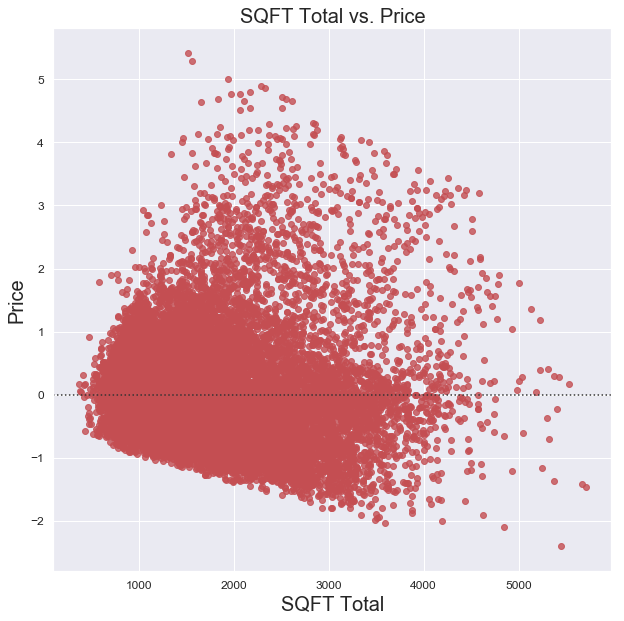

In [51]:
# Check residuals using sns.residplot
plt.figure(figsize=(10,10))
sns.residplot(x, y, data = kc, color='r')
plt.title('SQFT Total vs. Price', fontsize=20)
plt.xlabel('SQFT Total', fontsize=20)
plt.ylabel('Price', fontsize=20)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)
plt.show()

Using this simple linear regression model, we found that *sqft_total* predicts only 5% of the variance of our target *price*. The resulting F-statistic doesn't prove that the use of total square footage will predict the target. Our P-value indicates that this relationship isn't random, and the coefficient reveals little correlation. The data, given by our results, implies skewness and much of the data doen't fall within 3 standard deviations from the mean. Overall, using only this feature to predict future housing prices will not yield enough to build a satisfactory model. 

### Multiple Linear Regression: Model 1

Building an accurate model takes time, contemplation, and experimentation about which features should be included. Multiple regressions are based on the assumption that there is a linear relationship between both the target and the features. It also assumes no major correlation between the independent variables, which is why we checked for multicollinearity in the data scrubbing phase.

In [52]:
# Build a multiple linear regression model
kc_features = pd.DataFrame(data=kc, columns = None)
kc_features = kc.drop(['date', 'price', 'yr_built', 'yr_renovated', 'waterfront', 
                        'zipcode', 'lat', 'long', 'basement', 'renovated',
                      ],axis=1)

X = kc_features
y = kc['price']

# Add a constant
X_int = sm.add_constant(X)
linreg = sm.OLS(y,X_int).fit()
linreg.summary()

/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.570
Model:                            OLS   Adj. R-squared:                  0.570
Method:                 Least Squares   F-statistic:                     2314.
Date:                Sun, 19 May 2019   Prob (F-statistic):               0.00
Time:                        19:03:22   Log-Likelihood:                -20853.
No. Observations:               20927   AIC:                         4.173e+04
Df Residuals:                   20914   BIC:                         4.184e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          -303.3256     31.002     -9.784      0.000    -364.092    -242.559
bedrooms         -0.0588      0.006     -9.936      0.000      -0.070      -0.047
bathrooms        -0.0556      0.008     -7.393      0.000      -0.070      -0.041
sqft_lot          0.0013      0.007      0.174      0.862      -0.013       0.016
floors            0.0312      0.006      4.888      0.000       0.019       0.044
view              0.2330      0.007     34.673      0.000       0.220       0.246
condition         0.1900      0.007     25.876      0.000       0.176       0.204
grade             0.3443      0.007     49.209      0.000       0.331       0.358
sqft_above     -130.3269     13.500     -9.654      0.000    -156.788    -103.866
sqft_basement     0.1645      0.009     17.809      0.000       0.146       0.183
sqft_living15     0.0928      0.008     12.145      0.000       0.078       0.108
sqft_lot15       -0.0640      0.008     -8.486      0.000      -0.079      -0.049
sqft_total        0.1720      0.018      9.676      0.000       0.137       0.207
==============================================================================
Omnibus:                     5133.518   Durbin-Watson:                   1.965
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            18911.892
Skew:                           1.197   Prob(JB):                         0.00
Kurtosis:                       6.994   Cond. No.                     1.42e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.42e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**Interpretation:** 
* *Model Results:*
    * R-Squared = 0.570 $\rightarrow$ Selected features predicts 57% of the variance for price.
    * F-Statistic = 2314. $\rightarrow$ Cannot confirm features are signficant. 
* *Features:*
    * P-Values = 0 $\rightarrow$ Features predicting price isn't random. 
    * P-Values (sqft_lot) $\rightarrow$ Lot square footage predicting price is random
    * Coefficients = 0.0001 $\rightarrow$ Most significant coefficients have a positive correlation with price. 
* *Residuals:*
    * Skewness = 1.197 $\rightarrow$ Residuals are positively skewed.
    * Kurtosis = 6.994 $\rightarrow$ Residuals do not fall within 3 standard deviations of mean.
    * Jarque-Bera = 18911 $\rightarrow$ Data is not normal. 

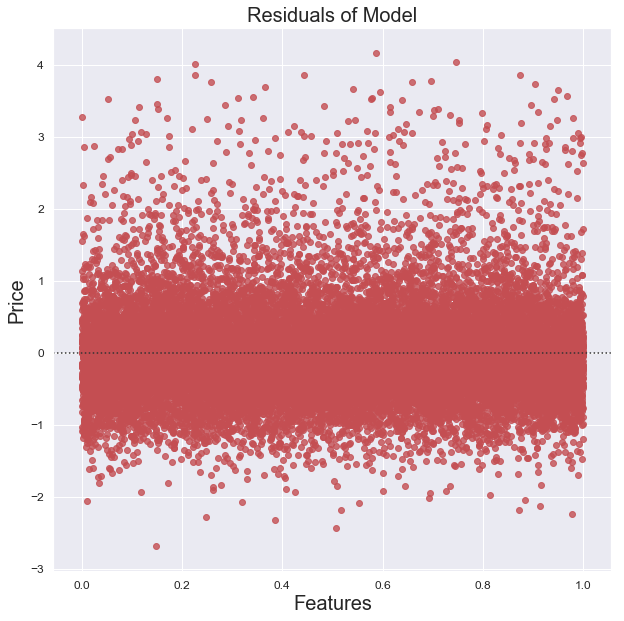

In [53]:
# Check residuals using sns.residplot
y_hat = linreg.predict()
residuals = kc['price'] - y_hat
x_vals = np.linspace(0, 1, len(residuals))

plt.figure(figsize=(10,10))
sns.residplot(x_vals, residuals, data = kc, color='r')
plt.title('Residuals of Model', fontsize=20)
plt.xlabel('Features', fontsize=20)
plt.ylabel('Price', fontsize=20)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)
plt.show()

Using this multiple linear regression model, we found that the selected features predict 57% of the variance of our target *price*. The resulting F-statistic doesn't prove that the use of the features will predict the target with total accuracy. The P-value indicates that most relationships aren't random (except for *sqft_lot)*, and the coefficient reveals positive correlation. The data, given by our results, implies skewness and much of the data doen't fall within 3 standard deviations from the mean. Overall, using these selected features yield a decent model for us to build upon. NOTICE: However, the condition number is large, 1.42e+07. This might indicate that there are strong multicollinearity or other numerical problems. This will be fixed in the next model.

### Multiple Linear Regression: Model 2

As said previously, building an accurate model takes time and experimentation. Multiple regressions are based on the assumption that there is a linear relationship between both the target and the features. It also assumes no major correlation between the independent variables, which is why we checked for multicollinearity in the data scrubbing phase. In the previous model, there was a factor that lead to significant multicollinearity. This will have to be fixed with model 2.

In [54]:
# Add column to indicate renovationYN
kc['renovatedYN'] = np.where(kc['yr_renovated']==kc.yr_built, 0, 1)

In [55]:
# Add column to indicate basementYN
kc['basementYN'] = np.where(kc['sqft_basement']>-0.65, 1, 0)

In [56]:
# Add column to indicate waterfrontYN
kc['waterfrontYN'] = np.where(kc['waterfront']==False, 0, 1)

In [57]:
kc.head()

,date,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,grade,...,lat,long,sqft_living15,sqft_lot15,basement,renovated,sqft_total,renovatedYN,basementYN,waterfrontYN
0,10/13/2014,-1.039211,-0.401517,-1.487348,-0.362833,-0.903307,False,0,3,7,...,47.5112,-122.257,-0.950188,-0.377262,False,False,1180,0,0,0
1,12/9/2014,0.085855,-0.401517,0.226775,-0.250424,0.949342,False,0,3,7,...,47.7210,-122.319,-0.411105,-0.198337,True,True,2171,1,1,0
2,2/25/2015,-1.188342,-1.538840,-1.487348,-0.055686,-0.903307,False,0,3,6,...,47.7379,-122.233,1.175340,-0.160286,False,False,770,0,0,0
3,12/9/2014,0.320763,0.735806,1.255249,-0.408729,-0.903307,False,0,5,7,...,47.5208,-122.393,-0.919383,-0.435734,True,False,1051,0,1,0
4,2/18/2015,-0.013803,-0.401517,-0.116050,-0.191254,-0.903307,False,0,3,8,...,47.6168,-122.045,-0.241679,-0.210571,False,False,1680,0,0,0


In [58]:
# Build a multiple linear regression model with constant
kc_features = pd.DataFrame(data=kc, columns = None)
kc_features = kc.drop(['date', 'price', 'yr_built', 'yr_renovated', 'waterfront', 
                        'zipcode', 'lat', 'long', 'basement', 'renovated',
                      'sqft_total', 'sqft_lot', 'floors', 'sqft_lot15', 
                       'bedrooms', 'bathrooms', 'condition',
                       ],axis=1)

X = kc_features
y = kc['price']

# Add a constant
X_int = sm.add_constant(X)
linreg = sm.OLS(y,X_int).fit()
linreg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.561
Model:                            OLS   Adj. R-squared:                  0.561
Method:                 Least Squares   F-statistic:                     3344.
Date:                Sun, 19 May 2019   Prob (F-statistic):               0.00
Time:                        19:03:22   Log-Likelihood:                -21075.
No. Observations:               20927   AIC:                         4.217e+04
Df Residuals:                   20918   BIC:                         4.224e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -2.7327      0.051    -53.786      0.000      -2.832      -2.633
view              0.2029      0.007     28.120      0.000       0.189       0.217
grade             0.3434      0.007     51.109      0.000       0.330       0.357
sqft_above        0.2384      0.008     28.241      0.000       0.222       0.255
sqft_basement     0.1433      0.009     16.589      0.000       0.126       0.160
sqft_living15     0.0842      0.008     11.172      0.000       0.069       0.099
renovatedYN       0.4382      0.026     17.073      0.000       0.388       0.489
basementYN        0.1518      0.018      8.529      0.000       0.117       0.187
waterfrontYN      0.9783      0.071     13.777      0.000       0.839       1.117
==============================================================================
Omnibus:                     4965.460   Durbin-Watson:                   1.960
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            17235.479
Skew:                           1.177   Prob(JB):                         0.00
Kurtosis:                       6.771   Cond. No.                         121.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Interpretation:** 
* *Model Results:*
    * R-Squared = 0.561 $\rightarrow$ Selected features predicts 56.1% of the variance for price.
    * F-Statistic = 3344. $\rightarrow$ Cannot confirm features are signficant. 
* *Features:*
    * P-Values = 0 $\rightarrow$ Features predicting price isn't random. 
    * Coefficient = -2.73 $\rightarrow$ Most significant coefficients have a positive correlation with price. 
    * Feature Coefficients > 0 $\rightarrow$ All coefficients have a positive correlation with price. 

* *Residuals:*
    * Skewness = 1.177 $\rightarrow$ Residuals are positively skewed.
    * Kurtosis = 6.771 $\rightarrow$ Residuals do not fall within 3 standard deviations of mean.
    * Jarque-Bera = 17235 $\rightarrow$ Data is not normal.

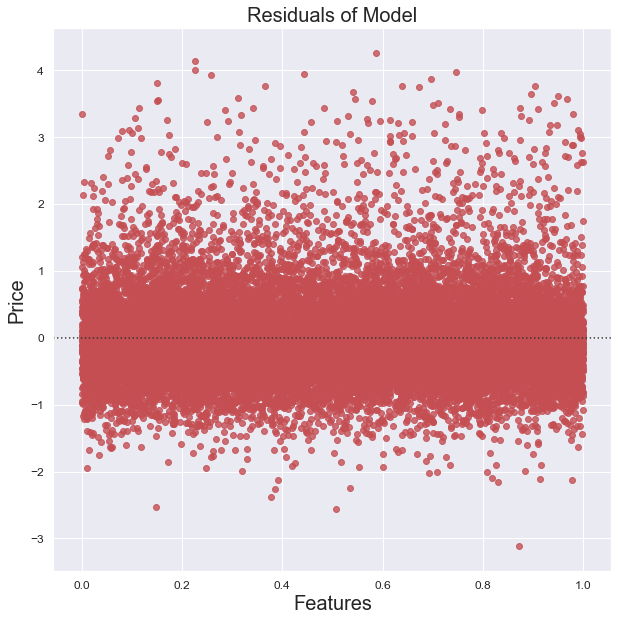

In [59]:
# Check residuals using sns.residplot
y_hat = linreg.predict()
residuals = kc['price'] - y_hat
x_vals = np.linspace(0, 1, len(residuals))

plt.figure(figsize=(10,10))
sns.residplot(x_vals, residuals, data = kc, color='r')
plt.title('Residuals of Model', fontsize=20)
plt.xlabel('Features', fontsize=20)
plt.ylabel('Price', fontsize=20)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)
plt.show()

This iteration of a multiple linear regression model finds that the selected features predict 56.1% of the variance of our target *price*. The resulting F-statistic doesn't prove that the use of the features will predict the target with total accuracy. The P-value indicates that all relationships aren't random and all feature coefficients reveal positive correlation. The data, given by our results, implies skewness and much of the data doen't fall within 3 standard deviations from the mean. Overall, using these selected features yields a valid model. The condition number is acceptable and inicates reasonable correlation. Additionally, a constant was added to the regression to aid the model in finding a best-fit line. 

### Multiple Linear Regression: Model 3

In [60]:
# Build a multiple linear regression model without constant
kc_features = pd.DataFrame(data=kc, columns = None)
kc_features = kc.drop(['date', 'price', 'yr_built', 'yr_renovated', 'waterfront', 
                        'zipcode', 'lat', 'long', 'basement', 'renovated',
                      'sqft_total', 'sqft_lot', 'floors', 'sqft_lot15', 
                       'bedrooms', 'bathrooms', 'condition'],axis=1)

X = kc_features
y = kc['price']

# Add a constant
# X_int = sm.add_constant(X)
linreg = sm.OLS(y, X).fit()
linreg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.500
Model:                            OLS   Adj. R-squared:                  0.500
Method:                 Least Squares   F-statistic:                     2620.
Date:                Sun, 19 May 2019   Prob (F-statistic):               0.00
Time:                        19:03:23   Log-Likelihood:                -22431.
No. Observations:               20927   AIC:                         4.488e+04
Df Residuals:                   20919   BIC:                         4.494e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
view              0.2213      0.008     28.775      0.000       0.206       0.236
grade            -0.0131      0.001    -11.106      0.000      -0.015      -0.011
sqft_above        0.4577      0.008     58.059      0.000       0.442       0.473
sqft_basement     0.1990      0.009     21.754      0.000       0.181       0.217
sqft_living15     0.1888      0.008     24.318      0.000       0.174       0.204
renovatedYN       0.4032      0.027     14.728      0.000       0.350       0.457
basementYN        0.1502      0.019      7.912      0.000       0.113       0.187
waterfrontYN      0.9330      0.076     12.316      0.000       0.785       1.082
==============================================================================
Omnibus:                     4728.989   Durbin-Watson:                   1.970
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            14952.495
Skew:                           1.153   Prob(JB):                         0.00
Kurtosis:                       6.440   Cond. No.                         120.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Interpretation:** 
* *Model Results:*
    * R-Squared = 0.500 $\rightarrow$ Selected features predicts 50% of the variance for price.
    * F-Statistic = 2620. $\rightarrow$ Cannot confirm features are signficant. 
* *Features:*
    * P-Values = 0 $\rightarrow$ Features predicting price isn't random. 
    * Feature Coefficients >= 0 $\rightarrow$ Most coefficients have a positive correlation with price. 

* *Residuals:*
    * Skewness = 1.153 $\rightarrow$ Residuals are positively skewed.
    * Kurtosis = 6.440 $\rightarrow$ Residuals do not fall within 3 standard deviations of mean.
    * Jarque-Bera = 14952 $\rightarrow$ Data is not normal.

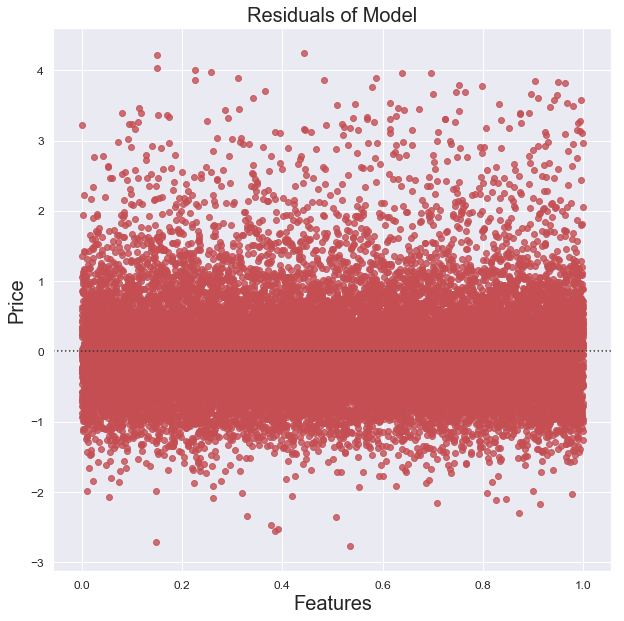

In [61]:
# Check residuals using sns.residplot
y_hat = linreg.predict()
residuals = kc['price'] - y_hat
x_vals = np.linspace(0, 1, len(residuals))

plt.figure(figsize=(10,10))
sns.residplot(x_vals, residuals, data = kc, color='r')
plt.title('Residuals of Model', fontsize=20)
plt.xlabel('Features', fontsize=20)
plt.ylabel('Price', fontsize=20)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)
plt.show()

This iteration of a multiple linear regression model finds that the selected features predict 50% of the variance of our target price. The resulting F-statistic doesn't prove that the use of the features will predict the target with total accuracy. The P-value indicates that all relationships aren't random and most feature coefficients reveal positive correlation. The data, given by our results, implies skewness and much of the data doen't fall within 3 standard deviations from the mean. Overall, using these selected features yields an averagly acceptable model. The condition number is acceptable and inicates reasonable correlation. In this iteration, the constant was removed and resulted in a worse R-squared score. 

### Multiple Linear Regression: Model 4

In [62]:
# Use np.log on features
logview = np.log(kc_features['view'])
loggrade = np.log(kc_features['grade'])
logsqft_above = np.log(kc_features['sqft_above'])
logsqft_basement = np.log(kc_features['sqft_basement'])
logsqft_living15 = np.log(kc_features['sqft_living15'])

# minmax scaling
kc_features['view'] = (logview-min(logview))/(max(logview)-min(logview))
kc_features['grade'] = (loggrade-min(loggrade))/(max(loggrade)-min(loggrade))
kc_features['sqft_above'] = (logsqft_above-min(logsqft_above))/(max(logsqft_above)-min(logsqft_above))
kc_features['sqft_basement'] = (logsqft_basement-min(logsqft_basement))/(max(logsqft_basement)-min(logsqft_basement))
kc_features['sqft_living15'] = (logsqft_living15-min(logsqft_living15))/(max(logsqft_living15)-min(logsqft_living15))

#standardization
kc_features["view"] = (logview-np.mean(logview))/np.sqrt(np.var(logview))
kc_features["grade"] = (loggrade-np.mean(loggrade))/np.sqrt(np.var(loggrade))
kc_features["sqft_above"] = (logsqft_above-np.mean(logsqft_above))/np.sqrt(np.var(logsqft_above))
kc_features["sqft_basement"] = (logsqft_basement-np.mean(logsqft_basement))/np.sqrt(np.var(logsqft_basement))
kc_features["sqft_living15"] = (logsqft_living15-np.mean(logsqft_living15))/np.sqrt(np.var(logsqft_living15))

kc_features = kc.drop(['date', 'price', 'yr_built', 'yr_renovated', 'waterfront', 
                        'zipcode', 'lat', 'long', 'basement', 'renovated',
                      'sqft_total', 'sqft_lot', 'floors', 'sqft_lot15', 
                       'bedrooms', 'bathrooms', 'condition'
                      ],axis=1)

X = kc_features
y = kc['price']

# Add a constant
X_int = sm.add_constant(X)
linreg = sm.OLS(y, X_int).fit()
linreg.summary()


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in log
  after removing the cwd from sys.path.
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in log
  """
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in log
  


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.561
Model:                            OLS   Adj. R-squared:                  0.561
Method:                 Least Squares   F-statistic:                     3344.
Date:                Sun, 19 May 2019   Prob (F-statistic):               0.00
Time:                        19:03:23   Log-Likelihood:                -21075.
No. Observations:               20927   AIC:                         4.217e+04
Df Residuals:                   20918   BIC:                         4.224e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -2.7327      0.051    -53.786      0.000      -2.832      -2.633
view              0.2029      0.007     28.120      0.000       0.189       0.217
grade             0.3434      0.007     51.109      0.000       0.330       0.357
sqft_above        0.2384      0.008     28.241      0.000       0.222       0.255
sqft_basement     0.1433      0.009     16.589      0.000       0.126       0.160
sqft_living15     0.0842      0.008     11.172      0.000       0.069       0.099
renovatedYN       0.4382      0.026     17.073      0.000       0.388       0.489
basementYN        0.1518      0.018      8.529      0.000       0.117       0.187
waterfrontYN      0.9783      0.071     13.777      0.000       0.839       1.117
==============================================================================
Omnibus:                     4965.460   Durbin-Watson:                   1.960
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            17235.479
Skew:                           1.177   Prob(JB):                         0.00
Kurtosis:                       6.771   Cond. No.                         121.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Interpretation:** 
* *Model Results:*
    * R-Squared = 0.561 $\rightarrow$ Selected features predicts 56.1% of the variance for price.
    * F-Statistic = 3344. $\rightarrow$ Cannot confirm features are signficant. 
* *Features:*
    * P-Values = 0 $\rightarrow$ Features predicting price isn't random. 
    * Coefficient = -2.73 $\rightarrow$ Most significant coefficients have a positive correlation with price. 
    * Feature Coefficients > 0 $\rightarrow$ All coefficients have a positive correlation with price. 

* *Residuals:*
    * Skewness = 1.177 $\rightarrow$ Residuals are positively skewed.
    * Kurtosis = 6.771 $\rightarrow$ Residuals do not fall within 3 standard deviations of mean.
    * Jarque-Bera = 17235 $\rightarrow$ Data is not normal.

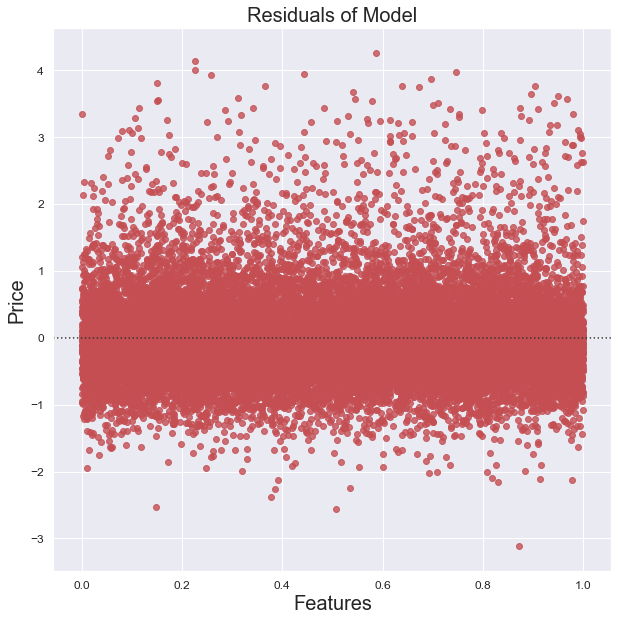

In [63]:
# Check residuals using sns.residplot
y_hat = linreg.predict()
residuals = kc['price'] - y_hat
x_vals = np.linspace(0, 1, len(residuals))

plt.figure(figsize=(10,10))
sns.residplot(x_vals, residuals, data = kc, color='r')
plt.title('Residuals of Model', fontsize=20)
plt.xlabel('Features', fontsize=20)
plt.ylabel('Price', fontsize=20)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)
plt.show()

This iteration of a multiple linear regression model yields the same results as iteration 2. The selected features predict 56.1% of the variance of our target *price*. The resulting F-statistic doesn't prove that the use of the features will predict the target with total accuracy. The P-value indicates that all relationships aren't random and all feature coefficients reveal positive correlation. The data, given by our results, implies skewness and much of the data doen't fall within 3 standard deviations from the mean. Overall, using these selected features yields a valid **final** model. The condition number is acceptable and inicates reasonable correlation. A constant was added to the regression to aid the model in finding a best-fit line. 

### Final Model

The final model and its' parameters determine the linear regression, which will help predict the future housing prices for Jumpstart Realty. The coefficients in the equation and its' constant value embody the parameters. As stated before, building an accurate model takes time, contemplation, and experimentation. This model phase, inlucing the final model, has experimented with five models that identify proper features with little colliniarity. 

In [64]:
# Build the final model
import statsmodels.api as sm
X_fin = kc[['view', 'grade', 'sqft_above', 'sqft_living15', 'renovatedYN', 'basementYN', 'waterfrontYN']]
X_int = sm.add_constant(X_fin)
model = sm.OLS(y,X_int).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.555
Model:                            OLS   Adj. R-squared:                  0.555
Method:                 Least Squares   F-statistic:                     3733.
Date:                Sun, 19 May 2019   Prob (F-statistic):               0.00
Time:                        19:03:24   Log-Likelihood:                -21212.
No. Observations:               20927   AIC:                         4.244e+04
Df Residuals:                   20919   BIC:                         4.250e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -2.8338      0.051    -55.817      0.000      -2.933      -2.734
view              0.2178      0.007     30.213      0.000       0.204       0.232
grade             0.3444      0.007     50.916      0.000       0.331       0.358
sqft_above        0.2313      0.008     27.265      0.000       0.215       0.248
sqft_living15     0.1062      0.007     14.227      0.000       0.092       0.121
renovatedYN       0.4558      0.026     17.655      0.000       0.405       0.506
basementYN        0.3882      0.011     36.206      0.000       0.367       0.409
waterfrontYN      0.9519      0.071     13.322      0.000       0.812       1.092
==============================================================================
Omnibus:                     5064.178   Durbin-Watson:                   1.961
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            17524.780
Skew:                           1.202   Prob(JB):                         0.00
Kurtosis:                       6.784   Cond. No.                         120.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Interpretation:** 
* *Model Results:*
    * R-Squared = 0.555 $\rightarrow$ Selected features predicts 55.5% of the variance for price.
    * F-Statistic = 3733. $\rightarrow$ Cannot confirm features are signficant. 
* *Features:*
    * P-Values = 0 $\rightarrow$ Features predicting price isn't random. 
    * Coefficient = -2.83 $\rightarrow$ Most significant coefficients have a positive correlation with price.
    * Feature Coefficients > 0 $\rightarrow$ All coefficients have a positive correlation with price. 

* *Residuals:*
    * Skewness = 1.202 $\rightarrow$ Residuals are positively skewed.
    * Kurtosis = 6.784 $\rightarrow$ Residuals do not fall within 3 standard deviations of mean.
    * Jarque-Bera = 17524 $\rightarrow$ Data is not normal.

**Sklearn Model:**

In [65]:
# Run the same model in Scikit-learn
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
linreg.fit(X_int, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [66]:
# Analyze coefficients in Sklearn
linreg.coef_

array([0.        , 0.21777657, 0.34436981, 0.23134921, 0.10617968,
       0.45577151, 0.3882309 , 0.95190122])

In [67]:
# Model
model = sm.OLS(y,X_int).fit()

In [68]:
# Model parameters
model.params

const           -2.833795
view             0.217777
grade            0.344370
sqft_above       0.231349
sqft_living15    0.106180
renovatedYN      0.455772
basementYN       0.388231
waterfrontYN     0.951901
dtype: float64

In [69]:
# Sklearn identify Y intercept and coefficients
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
linreg.fit(X_int, y)
print(linreg.intercept_)
print(linreg.coef_)

-2.8337952763679453
[0.         0.21777657 0.34436981 0.23134921 0.10617968 0.45577151
 0.3882309  0.95190122]


**Perform Train-Test Split:**

In [70]:
# Train-Test Split using Sklearn
from sklearn.model_selection import train_test_split

In [71]:
# Train-Test Split using Sklearn
X_train, X_test, y_train, y_test = train_test_split(X_int, y, test_size = 0.20)

In [72]:
# Preview of train test split
print(len(X_train), len(X_test), len(y_train), len(y_test))

16741 4186 16741 4186


In [73]:
# Fit the model and apply the model to the make test set predictions
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()

linreg.fit(X_train, y_train)
y_hat_test = linreg.predict(X_test)

In [74]:
# Calculate residuals and mean squared error
from sklearn.metrics import mean_squared_error
test_residuals = y_hat_test - y_test

test_mse = mean_squared_error(y_test, y_hat_test)
test_mse

0.477263010839456

**Perform Cross_Validation**

In [75]:
# Compare MSE for predicted values on the train and test sets.
y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)

In [76]:
# Compare MSE for predicted values on the train and test sets.
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.43662778323740103
Test Mean Squarred Error: 0.477263010839456


If the test error is substantially worse then our train error, this is a sign that our model doesn't generalize well to future cases. In this case, our Train MSE is right on par with the Test MSE. This is a good sign. 

In [77]:
# Use cross-validation for results 5, 10, 20
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score

cv_5_results = np.mean(cross_val_score(linreg, X_int, y, cv=5, scoring="neg_mean_squared_error"))
cv_10_results = np.mean(cross_val_score(linreg, X_int, y, cv=10, scoring="neg_mean_squared_error"))
cv_20_results = np.mean(cross_val_score(linreg, X_int, y, cv=20, scoring="neg_mean_squared_error"))
print(cv_5_results)
print(cv_10_results)
print(cv_20_results)

-0.44684313060969344
-0.44669014948772706
-0.44589416556725714


### Final Model Summary

The final iteration of the multiple linear regression model yields the final model in which Jumpstart Realty will use to predict future housing prices. The selected features predict 55.5% of the variance of our target *price*. The resulting F-statistic doesn't prove that the use of the features will predict the target with total accuracy. The P-value indicates that all relationships aren't random and all feature coefficients reveal positive correlation. The data, given by our results, implies skewness and much of the data doen't fall within 3 standard deviations from the mean. Overall, using these selected features yields a valid **final** model. The condition number is acceptable and inicates reasonable correlation. A constant was added to the regression to aid the model in finding a best-fit line. 

To begin validating the model, a train & test procedure was performed for the purpose of splitting the data into smaller sections and iterating through the model again. The test mean-squarred error resulted in a value of 0.447. The train mean-squarred error resulted in a value of 0.444. If the test error is substantially worse then our train error, this is a sign that our model doesn't generalize well to future cases. In this case, our Train MSE is right on par with the Test MSE. This is a good sign - it means the model will hold true with new data. This model also was satisfactory when splitting the data into differenct sections, using the cross validation results method in SKlearn. The test yielded values very similar to the test MSE.

**Final Regression Equation**:

y = $-2.83$ + $0.218(view)$ + $0.344(grade)$ + $0.231(sqftabove)$ + $0.106(sqftliving15)$ + 
         $0.445(renovatedYN)$ + $0.388(basementYN)$ + $0.952(waterfrontYN)$

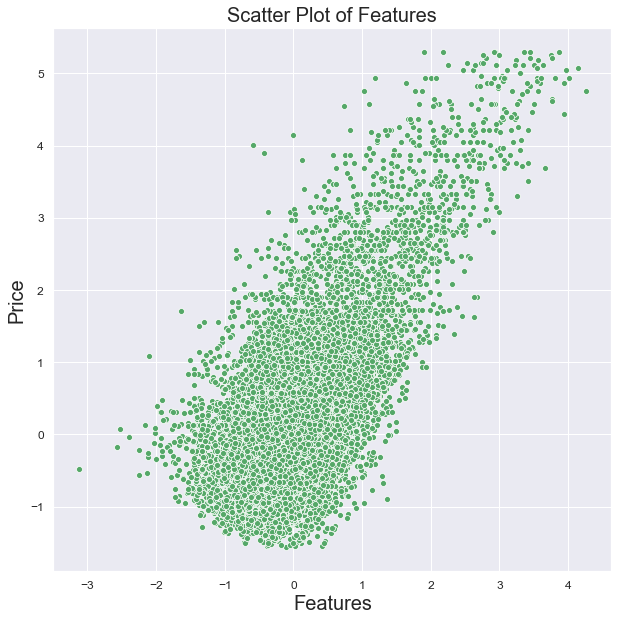

In [78]:
# Final scatterplot of features
plt.figure(figsize=(10,10))
sns.scatterplot(residuals, 'price', data = kc, color='g')
plt.title('Scatter Plot of Features', fontsize=20)
plt.xlabel('Features', fontsize=20)
plt.ylabel('Price', fontsize=20)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)
plt.show()

### Recommendations

To reiterate the usefulness of this business case, Jumpstart managers, along with senior agents and brokers, will use the resulting model to predict the housing market in King County. The scope of the project included housing data within King County, the economic health of buyers in the county, and the value of predictors that contribute to housing sales. The project will began on Monday May 13th, 2019 and was completed within a week, on Sunday May, 19th 2019. It's expected that all stateholders involved will conclude with the same understanding of the model and resulting datset. Jumpstart Realty looks to offer future buyers with high-caliber information to build trust between buyers and realtors.

**List of Recommendations**: 
    
* *Increase View Count*: The more views a house receives, the higher average value the house will obtain. Use this to identify properties that will become 'hot' on the market and capitalize on this. When a property starts to receive for views, increase marketing efforts for that particular property. This could drive value even higher with more offers coming in. 
    
    
* *Make Modern Renovations*: Housing grades are a reflection of design, features, and material quality. The better the grade, the higher value for the house. To improve upon a housing grade, encourage an owner to make renovations. As we have seen duirng the exploration phase, the more modern the features within the house, the higher the value.

    
* *Increase Square Footage*: This goes without saying - more square footage means a higher value for the house. Our model shows that when square footage is larger, the higher the price. To add onto square footage, consider making renovations to the first floor that could add a porch or a sun room. 


* *Neighbors Determine Value*: When the average square footage is higher in the closest 15 properties, the value of the house is increased. This is observable in the suburban zipcodes, such as Bellevue and Mercer Island. Agents and brokers should understand that when a property falls within the top three or five most valuable zipcodes, the higher the average square footage. Buyers with higher average incomes will be interested in these properties. It's also noteworthy that school ratings are also higher.


* *Add Basements to New Developments*: As empty lots become housing developments, make sure to recognize that a house with a basement with incur a higher value. And the more square footage the basement has, the higher the value. Current properties with a basement should be identifed and labeled with the potential for a higher price compared to the same property without a basement. 


* *Waterfronts are Key*: When a property sits on the waterfront, it's value is extremely higher than the same property without a waterfront view. It's important to recognize this fact. It's value is almost 50% higher than properties without a waterfront view.
    



### Conclusion

This wraps up the King County dataset project. In this project, I analyzed the 'King County House Sales' dataset with the purpose of predicting the future sale price of houses in King County as accurately as possible. The project cleaned, explored, and modeled this dataset with a multivariate linear regression to accomplish the purpose. To best illustrate the results of the model, it will be presented from a viewpoint of a hypothetical local startup business, called 'Jumpstart Realty'. Jumpstart Realty looks to offer future buyers with high-caliber information to build trust between buyers and realtors. This project followed a methodology, called OSEMiN, to build a best-fit model. OSEMiN suggested to follow certain relational steps to help understand the data and build the model. The framework is now completed and recommendations have been given.

### Futher Work

If given more time and data, I would like to have known features about current owners of each property iD. Some examples could include the average income, age, children count, and if relatives live within the county. This could add indicators about which customers would fit into each property. Because this dataset given was from a snapshot in time in 2015, I would also like to analyze the ebbs & flows of property values over time. This could identify new trends in 'up & coming' areas of King County and also areas that are in decline. 

Overall I'd like to thank the Jumpstart Realty team for the opportunity to work on this dataset and for the responsibility of presenting these findings.

<img src="im-done-my-work-meme.jpg" width = 400>